In [32]:
import torch
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd
import os
import umap
from utils.label_dict import protein_to_num_full
from matplotlib import cm
cmap = cm.nipy_spectral


In [17]:
def get_col_matrix(df, labels):
    if len(labels) == 1:
        values = df[labels[0]]
        unique_values = sorted(np.unique(values))
        mat = np.zeros((len(df), len(unique_values)))
        for ind, value in enumerate(unique_values):
            mat[np.where(values == value)[0], ind] = 1
        columns = unique_values
    else:
        mat = df[sorted(labels)].values.astype(int)
        columns = sorted(labels)
    return mat, columns

In [23]:
cd ..

/home/nick/Dino4Cells_analysis


In [5]:
files, classes, extras, IDs = torch.load('results_01_09_from_features_1channel_dino/processed_data.pth')

In [6]:
classes

[tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0]),
 tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0]),
 tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0]),
 tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0]),
 tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0]),
 tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0]),
 tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0]),
 tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0]),
 tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0]),
 tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0

In [24]:
from utils.label_dict import protein_to_num_full, protein_to_num_single_cells

In [25]:
mapping_dict = protein_to_num_full

In [ ]:
target_labels = ['nucleoplasm', 'nuclear membrane', 'nucleoli', 'nucleoli fibrillar center', 'nuclear speckles', 'nuclear bodies', 'endoplasmic reticulum', 'golgi apparatus', 'peroxisomes', 'endosomes', 'lysosomes', 'intermediate filaments', 'actin filaments', 'focal adhesion sites', 'microtubules', 'microtubule ends', 'cytokinetic bridge', 'mitotic spindle', 'microtubule organizing center', 'centrosome', 'lipid droplets', 'plasma membrane', 'cell junctions', 'mitochondria', 'aggresome', 'cytosol', 'cytoplasmic bodies', 'rods & rings']


In [ ]:
mapping = np.arange(len(target_labels))
for ind, p in enumerate(list(mapping_dict.keys())):
    mapping[ind] = target_labels.index(p)

In [ ]:
mapping

In [ ]:

# Convert one-hot tensors to numpy arrays
numpy_arrays = [tensor.numpy() for tensor in classes]

# Sum the numpy arrays along the appropriate axis (axis=0 in this case)
counts = np.sum(numpy_arrays, axis=0)

# Create histograms (if needed)
histogram, bin_edges = np.histogram(counts, bins=range(0, counts.max() + 1))

# Print counts and histogram
print("Counts:", counts)
print("Histogram:", histogram)
print("Bin Edges:", bin_edges)

In [ ]:
# Define the number of bins and the range for the histogram
num_bins = 10  # Adjust as needed
hist_min, hist_max = 0, 10  # Adjust the range as needed
# Create a histogram
histogram, bin_edges = np.histogram(counts, bins=num_bins, range=(hist_min, hist_max))

# Plot the histogram
plt.figure(figsize=(10, 6))
plt.hist(counts, bins=num_bins, range=(hist_min, hist_max), edgecolor='k', alpha=0.75)
plt.title('Histogram of Counts')
plt.xlabel('Counts')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

In [ ]:


# Define the file path
file_path = "results/classification_output/submission_whole_images.csv"  # Adjust the path as needed

# Read the CSV file into a pandas DataFrame
df = pd.read_csv(file_path, header=0)

# Display the DataFrame
print(df)

In [ ]:
df['Class'] = df['Predicted']

# Split the "Predicted" column by space and take the maximum value
df["Predicted"] = df["Predicted"].apply(lambda x: max(map(int, x.split())))

# Plot the histogram
plt.hist(df["Predicted"], bins=range(df["Predicted"].min(), df["Predicted"].max() + 2), align='left', rwidth=0.8)

# Add labels and title
plt.xlabel("Predicted Class")
plt.ylabel("Frequency")
plt.title("Histogram of Predicted Classes")

# Show the plot
plt.show()

# Convert the "Class" column to integers (in case it's not already)
df["Class"] = df["Predicted"].astype(int)

# Plot the histogram
plt.hist(df["Class"], bins=range(df["Class"].min(), df["Class"].max() + 2), align='left', rwidth=0.8)

# Add labels and title
plt.xlabel("Predicted Class")
plt.ylabel("Frequency")
plt.title("Histogram of Predicted Classes")

# Show the plot
plt.show()

In [ ]:
# Your class labels and counts
class_labels = list(range(28))
class_counts = [960, 160, 1086, 1479, 542, 300, 22761, 2046, 92, 576, 4528, 626, 165, 98, 17, 619, 1201, 5695, 147, 2453, 1288, 2629, 4407, 1558, 33346, 139, 7563, 45]

# Ensure both lists have the same length
if len(class_labels) != len(class_counts):
    raise ValueError("Class labels and counts must have the same length")

# Create a bar plot
plt.bar(class_labels, class_counts)

# Add labels and a title
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Class Counts')

# Show the plot
plt.show()

In [ ]:
len(class_counts)

In [ ]:
protein_to_num_full

## Umaps of 4d data -- testing and training. 

In [12]:
dir = '/home/nick/Dino4Cells_analysis'
kaggle_test_file = 'results_12_23_from_features_4channel_dino_blue_first.pth'
kaggle_test = torch.load(os.path.join(dir, kaggle_test_file))

In [13]:
kaggle_train_file = 'results_01_11_from_features_4channel_dino_train.pth'
kaggle_train = torch.load(os.path.join(dir, kaggle_train_file))

In [19]:
reducer = umap.UMAP(random_state=42)
embedding = reducer.fit_transform(kaggle_train[0])

/home/nick/miniconda3/envs/dino_cuda12/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


/tmp/ipykernel_12864/1324320536.py:1: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(embedding[:, 0], embedding[:, 1], cmap='Spectral', s=5)


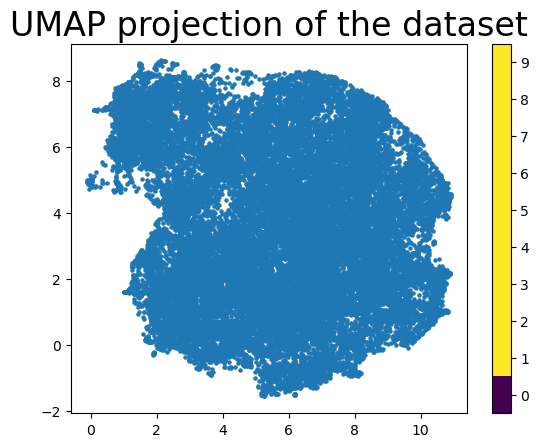

In [15]:
plt.scatter(embedding[:, 0], embedding[:, 1], cmap='Spectral', s=5)
plt.gca().set_aspect('equal', 'datalim')
plt.colorbar(boundaries=np.arange(11)-0.5).set_ticks(np.arange(10))
plt.title('UMAP projection of the dataset', fontsize=24)
plt.show()

In [16]:
train_path = '/home/nick/data/HPA_FOV_data/4channel_12_18_DINO_features_for_HPA_FOV.pth'

In [ ]:
features, protein_localizations, cell_lines, IDs = torch.load(train_path)

In [8]:
df_path = '/home/nick/Dino4Cells_analysis/exploratory_configs/filtered_updated_whole_images.csv'
train_df = pd.read_csv(df_path)

In [9]:
train_df

,Unnamed: 0,file,protein_location,cell_type,ID,nucleoplasm,nuclear membrane,nucleoli,nucleoli fibrillar center,nuclear speckles,...,RT4,SH-SY5Y,SK-MEL-30,SiHa,SuSa,THP-1,U-2 OS,U-251 MG,hTCEpi,hTERT-RPE1
0,0,/home/nick/custom_scripts/path/to/output_dir/4...,['vesicles'],A-431,49232_769_H3_1,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,1,/home/nick/custom_scripts/path/to/output_dir/4...,['vesicles'],A-431,49232_769_H3_11,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,2,/home/nick/custom_scripts/path/to/output_dir/4...,['vesicles'],U-2 OS,49232_761_H3_1,False,False,False,False,False,...,False,False,False,False,False,False,True,False,False,False
3,3,/home/nick/custom_scripts/path/to/output_dir/4...,['vesicles'],U-2 OS,49232_761_H3_2,False,False,False,False,False,...,False,False,False,False,False,False,True,False,False,False
4,4,/home/nick/custom_scripts/path/to/output_dir/4...,['vesicles'],U-251 MG,49232_757_H3_1,False,False,False,False,False,...,False,False,False,False,False,False,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74943,86806,/home/nick/custom_scripts/path/to/output_dir/6...,['nucleoplasm'],MCF7,60380_1082_E3_6,True,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
74944,86807,/home/nick/custom_scripts/path/to/output_dir/6...,['nucleoplasm'],U-2 OS,60380_1103_E3_1,True,False,False,False,False,...,False,False,False,False,False,False,True,False,False,False
74945,86808,/home/nick/custom_scripts/path/to/output_dir/6...,['nucleoplasm'],U-2 OS,60380_1103_E3_2,True,False,False,False,False,...,False,False,False,False,False,False,True,False,False,False
74946,86809,/home/nick/custom_scripts/path/to/output_dir/6...,['nucleoplasm'],U-251 MG,60380_1252_F10_3,True,False,False,False,False,...,False,False,False,False,False,False,False,True,False,False


In [14]:
reducer = umap.UMAP(random_state=42)


In [26]:
def plot_UMAP(df, labels, embedding, title, color_indices):
    mat, labels = get_col_matrix(df, labels)
    plt.figure(figsize=(10, 10), facecolor='white', dpi=300)
    plt.axis(False)
    plt.scatter(embedding[:, 0],
                embedding[:, 1],
                s=0.01,
                label='All data',
                color='grey'
               )
    for i, ind in enumerate(np.argsort(mat.sum(axis=0))[::-1]):
        indices = np.where((mat[:, ind] == 1) & (mat.sum(axis=1) == 1))[0]
        plt.scatter(embedding[indices, 0],
                    embedding[indices, 1],
                    s=0.01,
                    label=labels[ind],
                    color=cmap(color_indices[ind] / mat.shape[1])
                   )

    plt.xlabel('UMAP 1')
    plt.ylabel('UMAP 2')
    plt.title(title, fontsize=15)
    lgnd = plt.legend(bbox_to_anchor=(1, 1), frameon=False)
    for h in lgnd.legendHandles:
        h._sizes = [30]

    # Display the plot
    plt.show()

In [ ]:
len(train_data[0])

In [ ]:
embedding = reducer.fit_transform(train_data[0])

In [29]:
protein_labels = protein_to_num_full

In [30]:
protein_color_indices = torch.load('/home/nick/data/HPA_FOV_data/whole_image_protein_color_indices.pth')
cell_color_indices = torch.load('/home/nick/data/HPA_FOV_data/whole_image_cell_color_indices.pth')


In [34]:
plot_UMAP(train_df, protein_labels, embedding,  f'4d training embeddings: all protein localizations',c)

NameError: name 'get_col_matrix' is not defined

/tmp/ipykernel_10705/1047878720.py:24: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for h in lgnd.legendHandles:


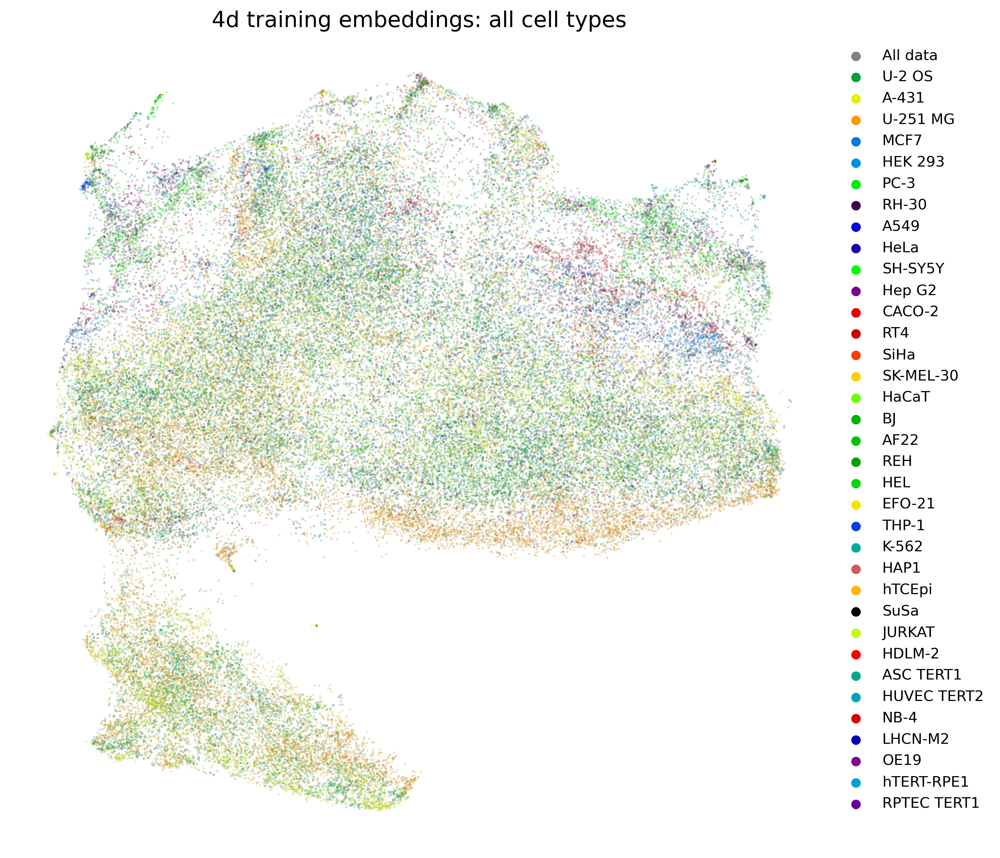

In [42]:
plot_UMAP(train_df, ['cell_type'], embedding,  f'4d training embeddings: all cell types',cell_color_indices)

/tmp/ipykernel_10705/1324320536.py:1: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(embedding[:, 0], embedding[:, 1], cmap='Spectral', s=5)


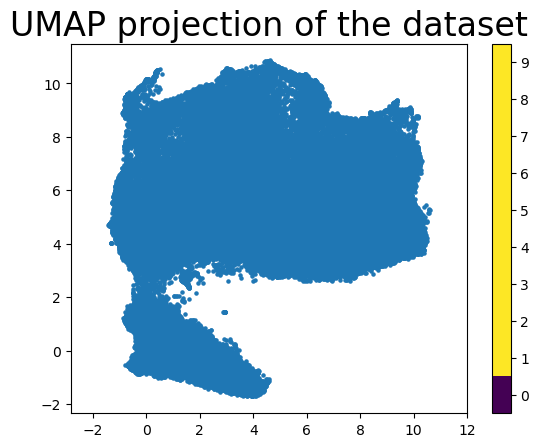

In [13]:
plt.scatter(embedding[:, 0], embedding[:, 1], cmap='Spectral', s=5)
plt.gca().set_aspect('equal', 'datalim')
plt.colorbar(boundaries=np.arange(11)-0.5).set_ticks(np.arange(10))
plt.title('UMAP projection of the dataset', fontsize=24)
plt.show()

## Umaps of 1d data -- testing and training. 

In [53]:
train_path = '/home/nick/Dino4Cells_analysis/results_01_09_from_features_1channel_dino/processed_data.pth'

In [54]:
features, protein_localizations, cell_lines, IDs = torch.load(train_path)

In [56]:
# Step 1: Create a set of valid IDs for fast lookup
valid_ids_set = set(train_df['ID'])

# Step 2: Collect indices of valid items
valid_indices = [i for i, id_val in enumerate(IDs) if id_val in valid_ids_set]

# Step 3: Filter features, protein_localizations, cell_lines, and IDs by valid_indices
# If these are torch tensors or numpy arrays, you can index with a list of indices
features = features[valid_indices] 

In [57]:
len(features)

74948

In [58]:

# Step 1: Create a mapping from ID to feature (tensor)
id_to_feature = {id: feature for id, feature in zip(IDs, features)}

# Step 2: Reorder features to match the order in train_df['ID']
# Ensure that all IDs in train_df['ID'] are in the id_to_feature dictionary
reordered_features = torch.stack([id_to_feature[id] for id in train_df['ID'] if id in id_to_feature])



In [61]:
IDs

['10005_921_B9_1',
 '10005_921_B9_2',
 '10005_923_B9_1',
 '10005_923_B9_2',
 '10007_1876_A7_32',
 '10007_1876_A7_37',
 '10007_1901_A10_2',
 '10007_1901_A10_3',
 '10007_1936_E4_2',
 '10007_1936_E4_3',
 '10008_56_F11_1',
 '10008_56_F11_2',
 '10008_57_F11_1',
 '10008_57_F11_2',
 '10008_58_F11_1',
 '10008_58_F11_2',
 '10021_1913_E15_1',
 '10021_1913_E15_2',
 '10021_1936_D4_2',
 '10021_1936_D4_3',
 '10023_100_C10_2',
 '10023_101_C10_2',
 '10023_82_C10_1',
 '10023_82_C10_2',
 '10025_47_H7_1',
 '10025_47_H7_2',
 '10025_48_H7_1',
 '10025_48_H7_2',
 '10025_49_H7_1',
 '10025_49_H7_2',
 '10027_47_A8_1',
 '10027_47_A8_2',
 '10027_48_A8_1',
 '10027_48_A8_2',
 '10027_49_A8_1',
 '10027_49_A8_2',
 '10032_921_C9_1',
 '10032_921_C9_2',
 '10032_923_C9_1',
 '10032_923_C9_2',
 '10032_931_C9_1',
 '10032_931_C9_2',
 '10036_962_G1_1',
 '10036_962_G1_2',
 '10036_970_G1_1',
 '10036_970_G1_4',
 '10036_973_A9_1',
 '10036_973_A9_2',
 '10046_921_D9_1',
 '10046_921_D9_2',
 '10046_923_D9_2',
 '10046_923_D9_3',
 '1004

In [59]:
# Step 1: Filter train_df to only include rows with IDs in the IDs list
train_df_filtered = train_df[train_df['ID'].isin(IDs)]

# Step 2: Reorder train_df to match the order of IDs in the IDs list
# Create an ordered categorical type based on the order in the IDs list
train_df_filtered['ID'] = pd.Categorical(train_df_filtered['ID'], categories=IDs, ordered=True)

# Sort by the 'ID' column
train_df_filtered = train_df_filtered.sort_values('ID')

# Reset index if needed (optional)
train_df_filtered = train_df_filtered.reset_index(drop=True)


In [60]:
train_df_filtered

,Unnamed: 0,file,protein_location,cell_type,ID,nucleoplasm,nuclear membrane,nucleoli,nucleoli fibrillar center,nuclear speckles,...,RT4,SH-SY5Y,SK-MEL-30,SiHa,SuSa,THP-1,U-2 OS,U-251 MG,hTCEpi,hTERT-RPE1
0,14516,/home/nick/custom_scripts/path/to/output_dir/1...,['cytosol'],A-431,10005_921_B9_1,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,14517,/home/nick/custom_scripts/path/to/output_dir/1...,['cytosol'],A-431,10005_921_B9_2,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,14520,/home/nick/custom_scripts/path/to/output_dir/1...,['cytosol'],U-251 MG,10005_923_B9_1,False,False,False,False,False,...,False,False,False,False,False,False,False,True,False,False
3,14521,/home/nick/custom_scripts/path/to/output_dir/1...,['cytosol'],U-251 MG,10005_923_B9_2,False,False,False,False,False,...,False,False,False,False,False,False,False,True,False,False
4,43010,/home/nick/custom_scripts/path/to/output_dir/1...,['endoplasmic reticulum'],ASC TERT1,10007_1876_A7_32,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74943,25405,/home/nick/custom_scripts/path/to/output_dir/9...,"['nuclear speckles', 'plasma membrane']",U-251 MG,99_611_F12_2,False,False,False,False,True,...,False,False,False,False,False,False,False,True,False,False
74944,25402,/home/nick/custom_scripts/path/to/output_dir/9...,"['nuclear speckles', 'plasma membrane']",U-2 OS,99_614_F12_2,False,False,False,False,True,...,False,False,False,False,False,False,True,False,False,False
74945,25403,/home/nick/custom_scripts/path/to/output_dir/9...,"['nuclear speckles', 'plasma membrane']",U-2 OS,99_614_F12_3,False,False,False,False,True,...,False,False,False,False,False,False,True,False,False,False
74946,25400,/home/nick/custom_scripts/path/to/output_dir/9...,"['nuclear speckles', 'cell junctions']",A-431,99_618_F12_1,False,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False


In [26]:
len(reordered_features)

74948

In [62]:
embedding = reducer.fit_transform(features)

/home/nick/miniconda3/envs/dino_cuda12/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


/tmp/ipykernel_13404/1047878720.py:24: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for h in lgnd.legendHandles:


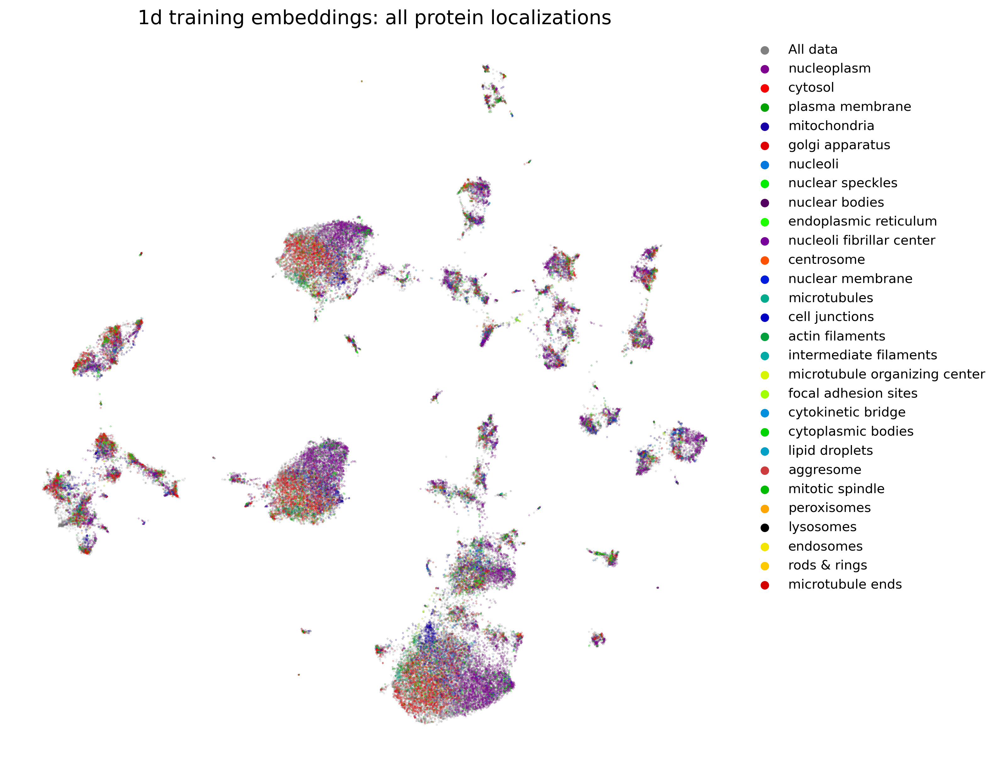

In [63]:
plot_UMAP(train_df_filtered, protein_labels, embedding,  f'1d training embeddings: all protein localizations',protein_color_indices)

/tmp/ipykernel_13404/1047878720.py:24: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for h in lgnd.legendHandles:


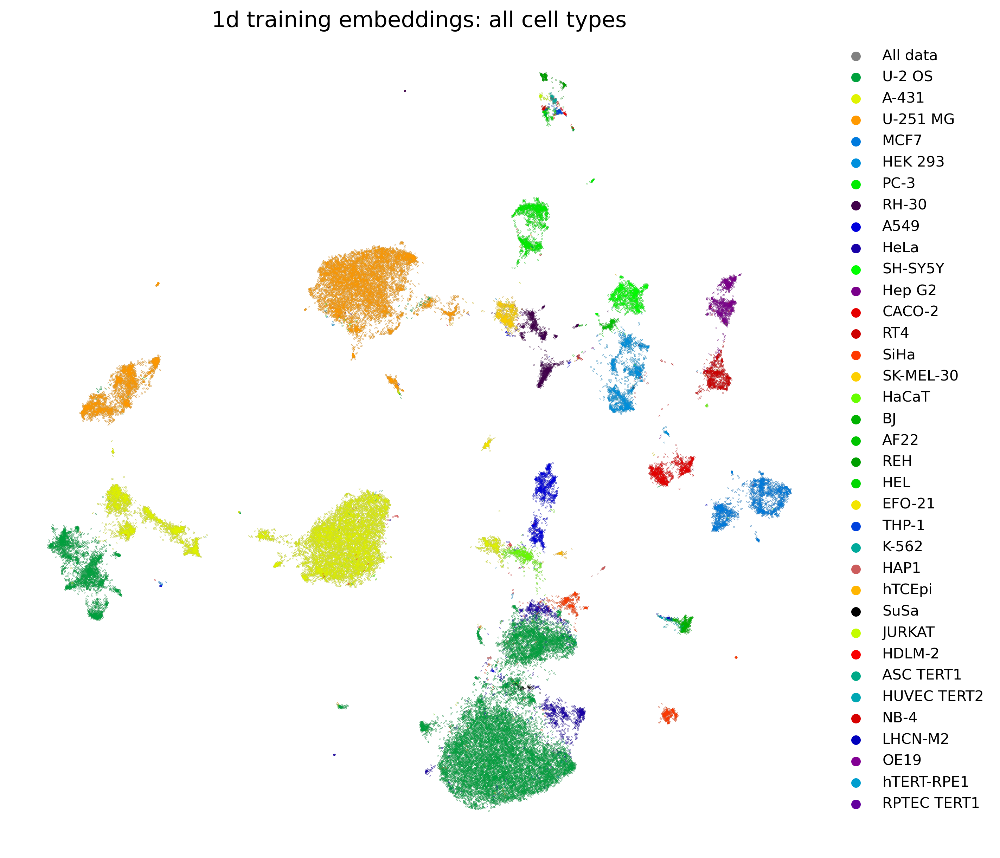

In [64]:
plot_UMAP(train_df_filtered, ['cell_type'], embedding,  f'1d training embeddings: all cell types',cell_color_indices)

In [36]:
train_path_1d = '/home/nick/Dino4Cells_analysis/results_01_09_from_features_1channel_dino/results_01_09_from_features_1channel_dino.pth'

In [63]:
train_df

,Unnamed: 0,file,protein_location,cell_type,ID,nucleoplasm,nuclear membrane,nucleoli,nucleoli fibrillar center,nuclear speckles,...,RT4,SH-SY5Y,SK-MEL-30,SiHa,SuSa,THP-1,U-2 OS,U-251 MG,hTCEpi,hTERT-RPE1
0,0,/home/nick/custom_scripts/path/to/output_dir/4...,['vesicles'],A-431,49232_769_H3_1,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,1,/home/nick/custom_scripts/path/to/output_dir/4...,['vesicles'],A-431,49232_769_H3_11,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,2,/home/nick/custom_scripts/path/to/output_dir/4...,['vesicles'],U-2 OS,49232_761_H3_1,False,False,False,False,False,...,False,False,False,False,False,False,True,False,False,False
3,3,/home/nick/custom_scripts/path/to/output_dir/4...,['vesicles'],U-2 OS,49232_761_H3_2,False,False,False,False,False,...,False,False,False,False,False,False,True,False,False,False
4,4,/home/nick/custom_scripts/path/to/output_dir/4...,['vesicles'],U-251 MG,49232_757_H3_1,False,False,False,False,False,...,False,False,False,False,False,False,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74943,86806,/home/nick/custom_scripts/path/to/output_dir/6...,['nucleoplasm'],MCF7,60380_1082_E3_6,True,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
74944,86807,/home/nick/custom_scripts/path/to/output_dir/6...,['nucleoplasm'],U-2 OS,60380_1103_E3_1,True,False,False,False,False,...,False,False,False,False,False,False,True,False,False,False
74945,86808,/home/nick/custom_scripts/path/to/output_dir/6...,['nucleoplasm'],U-2 OS,60380_1103_E3_2,True,False,False,False,False,...,False,False,False,False,False,False,True,False,False,False
74946,86809,/home/nick/custom_scripts/path/to/output_dir/6...,['nucleoplasm'],U-251 MG,60380_1252_F10_3,True,False,False,False,False,...,False,False,False,False,False,False,False,True,False,False


In [65]:
features, IDs = torch.load(train_path_1d)

In [66]:
len(IDs)

302464

In [67]:
indexes = [i for i, id1 in enumerate(IDs) if id1.endswith('channel_0') and id1.replace('_channel_0', '') in valid_ids_set]

In [68]:
len(features[indexes])

74948

In [69]:
ids_modified = [id1.replace('_channel_0', '') for id1 in np.array(IDs)[indexes]]

In [70]:
ids_modified

['10005_921_B9_1',
 '10005_921_B9_2',
 '10005_923_B9_1',
 '10005_923_B9_2',
 '10007_1876_A7_32',
 '10007_1876_A7_37',
 '10007_1901_A10_2',
 '10007_1901_A10_3',
 '10007_1936_E4_2',
 '10007_1936_E4_3',
 '10008_56_F11_1',
 '10008_56_F11_2',
 '10008_57_F11_1',
 '10008_57_F11_2',
 '10008_58_F11_1',
 '10008_58_F11_2',
 '10021_1913_E15_1',
 '10021_1913_E15_2',
 '10021_1936_D4_2',
 '10021_1936_D4_3',
 '10023_100_C10_2',
 '10023_101_C10_2',
 '10023_82_C10_1',
 '10023_82_C10_2',
 '10025_47_H7_1',
 '10025_47_H7_2',
 '10025_48_H7_1',
 '10025_48_H7_2',
 '10025_49_H7_1',
 '10025_49_H7_2',
 '10027_47_A8_1',
 '10027_47_A8_2',
 '10027_48_A8_1',
 '10027_48_A8_2',
 '10027_49_A8_1',
 '10027_49_A8_2',
 '10032_921_C9_1',
 '10032_921_C9_2',
 '10032_923_C9_1',
 '10032_923_C9_2',
 '10032_931_C9_1',
 '10032_931_C9_2',
 '10036_962_G1_1',
 '10036_962_G1_2',
 '10036_970_G1_1',
 '10036_970_G1_4',
 '10036_973_A9_1',
 '10036_973_A9_2',
 '10046_921_D9_1',
 '10046_921_D9_2',
 '10046_923_D9_2',
 '10046_923_D9_3',
 '1004

In [71]:
embedding = reducer.fit_transform(features[indexes])

/home/nick/miniconda3/envs/dino_cuda12/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


In [72]:
train_df

,Unnamed: 0,file,protein_location,cell_type,ID,nucleoplasm,nuclear membrane,nucleoli,nucleoli fibrillar center,nuclear speckles,...,RT4,SH-SY5Y,SK-MEL-30,SiHa,SuSa,THP-1,U-2 OS,U-251 MG,hTCEpi,hTERT-RPE1
0,0,/home/nick/custom_scripts/path/to/output_dir/4...,['vesicles'],A-431,49232_769_H3_1,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,1,/home/nick/custom_scripts/path/to/output_dir/4...,['vesicles'],A-431,49232_769_H3_11,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,2,/home/nick/custom_scripts/path/to/output_dir/4...,['vesicles'],U-2 OS,49232_761_H3_1,False,False,False,False,False,...,False,False,False,False,False,False,True,False,False,False
3,3,/home/nick/custom_scripts/path/to/output_dir/4...,['vesicles'],U-2 OS,49232_761_H3_2,False,False,False,False,False,...,False,False,False,False,False,False,True,False,False,False
4,4,/home/nick/custom_scripts/path/to/output_dir/4...,['vesicles'],U-251 MG,49232_757_H3_1,False,False,False,False,False,...,False,False,False,False,False,False,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74943,86806,/home/nick/custom_scripts/path/to/output_dir/6...,['nucleoplasm'],MCF7,60380_1082_E3_6,True,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
74944,86807,/home/nick/custom_scripts/path/to/output_dir/6...,['nucleoplasm'],U-2 OS,60380_1103_E3_1,True,False,False,False,False,...,False,False,False,False,False,False,True,False,False,False
74945,86808,/home/nick/custom_scripts/path/to/output_dir/6...,['nucleoplasm'],U-2 OS,60380_1103_E3_2,True,False,False,False,False,...,False,False,False,False,False,False,True,False,False,False
74946,86809,/home/nick/custom_scripts/path/to/output_dir/6...,['nucleoplasm'],U-251 MG,60380_1252_F10_3,True,False,False,False,False,...,False,False,False,False,False,False,False,True,False,False


/tmp/ipykernel_13404/1047878720.py:24: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for h in lgnd.legendHandles:


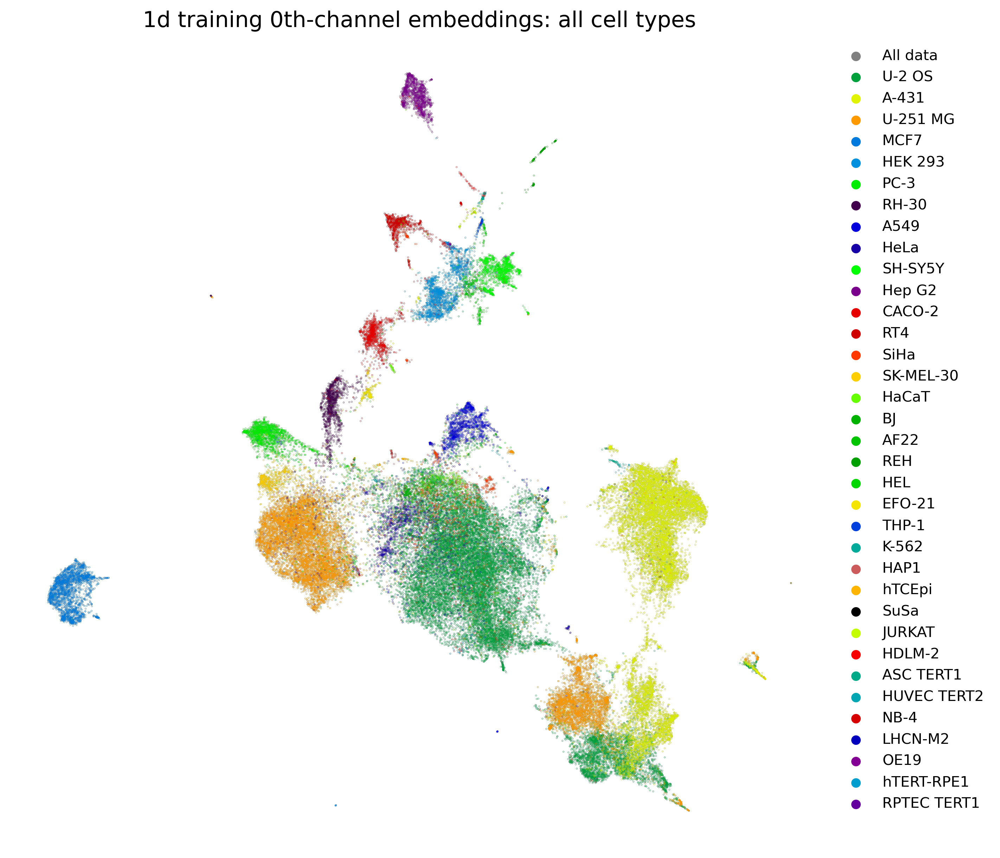

In [73]:
plot_UMAP(train_df_filtered, ['cell_type'], embedding,  f'1d training 0th-channel embeddings: all cell types',cell_color_indices)

/tmp/ipykernel_13404/1047878720.py:24: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for h in lgnd.legendHandles:


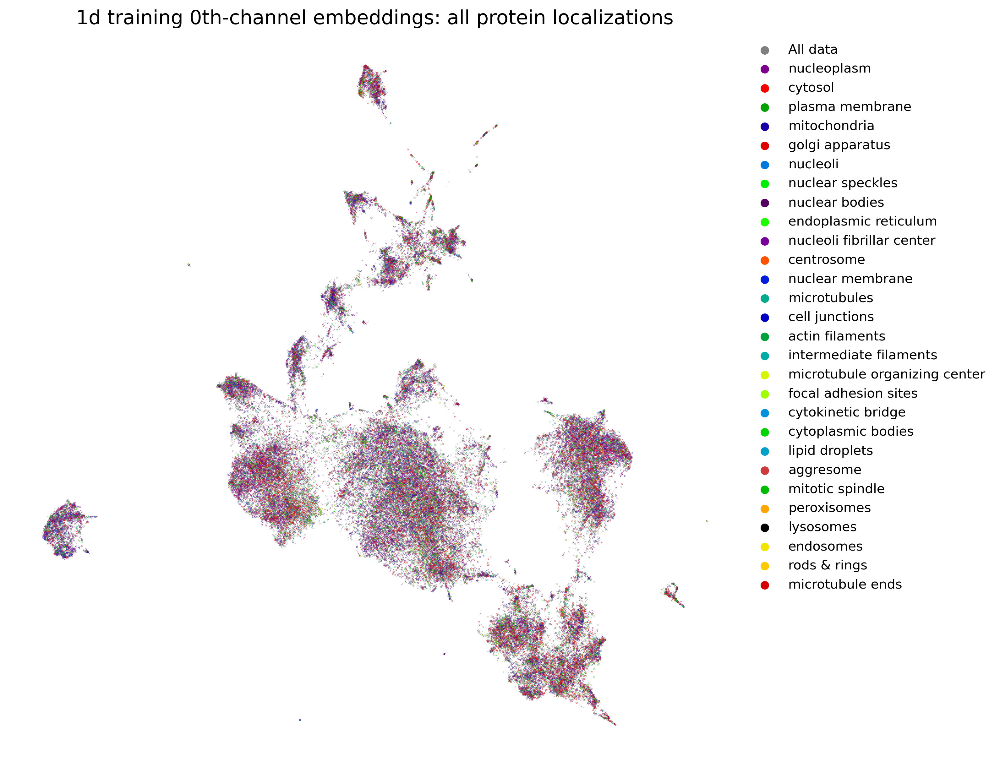

In [74]:
plot_UMAP(train_df_filtered, protein_labels, embedding,  f'1d training 0th-channel embeddings: all protein localizations',protein_color_indices)

In [75]:
indexes = [i for i, id1 in enumerate(IDs) if id1.endswith('channel_1') and id1.replace('_channel_1', '') in valid_ids_set]

In [2]:
embedding = reducer.fit_transform(features[indexes])

NameError: name 'reducer' is not defined

In [ ]:
plot_UMAP(train_df_filtered, ['cell_type'], embedding,  f'1d training 1th-channel embeddings: all cell types',cell_color_indices)

In [ ]:
plot_UMAP(train_df_filtered, protein_labels, embedding,  f'1d training 1th-channel embeddings: all protein localizations',protein_color_indices)

In [ ]:
indexes = [i for i, id1 in enumerate(IDs) if id1.endswith('channel_2') and id1.replace('_channel_2', '') in valid_ids_set]

In [ ]:
embedding = reducer.fit_transform(features[indexes])

In [ ]:
plot_UMAP(train_df_filtered, ['cell_type'], embedding,  f'1d training 2th-channel embeddings: all cell types',cell_color_indices)

In [ ]:
plot_UMAP(train_df_filtered, protein_labels, embedding,  f'1d training 2th-channel embeddings: all protein localizations',protein_color_indices)